In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install rasterio

In [ ]:
!pip install torchmetrics  


In [4]:
!pip install -q -U segmentation-models-pytorch albumentations > /dev/null
import segmentation_models_pytorch as smp

In [5]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


# Load Data and visualize

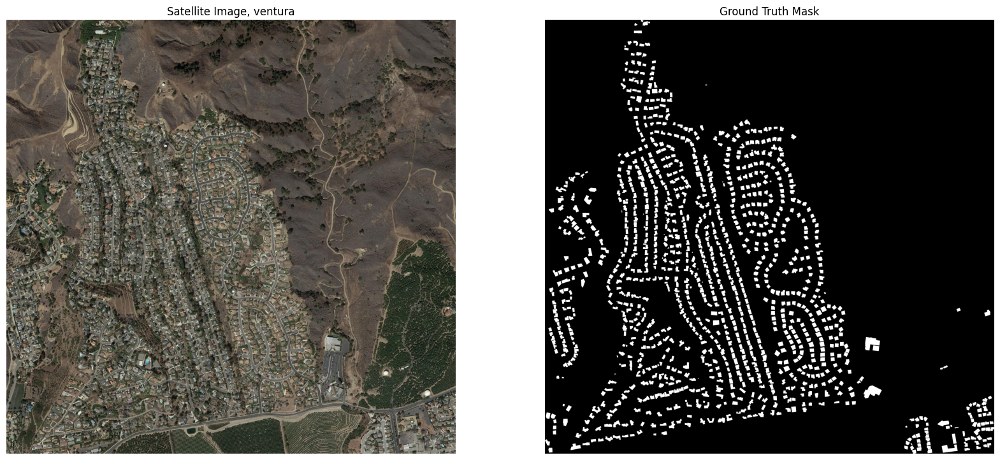

In [6]:
r = rasterio.open("/content/drive/MyDrive/домики_тестовое_задание/домики_тестовое_задание/ventura/RED.tif").read(1)
g = rasterio.open("/content/drive/MyDrive/домики_тестовое_задание/домики_тестовое_задание/ventura/GRN.tif").read(1)
b = rasterio.open("/content/drive/MyDrive/домики_тестовое_задание/домики_тестовое_задание/ventura/BLUE.tif").read(1)

rgb_image_ventura = np.stack([r, g, b], axis=-1)

mask_ventura = rasterio.open("/content/drive/MyDrive/домики_тестовое_задание/домики_тестовое_задание/ventura/all.tif").read(1)  # Assuming binary mask is single-channel

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(rgb_image_ventura)
plt.axis("off")
plt.title("Satellite Image, ventura")
plt.subplot(1, 2, 2)
plt.imshow(mask_ventura, cmap="gray")
plt.axis("off")
plt.title("Ground Truth Mask")
plt.show()


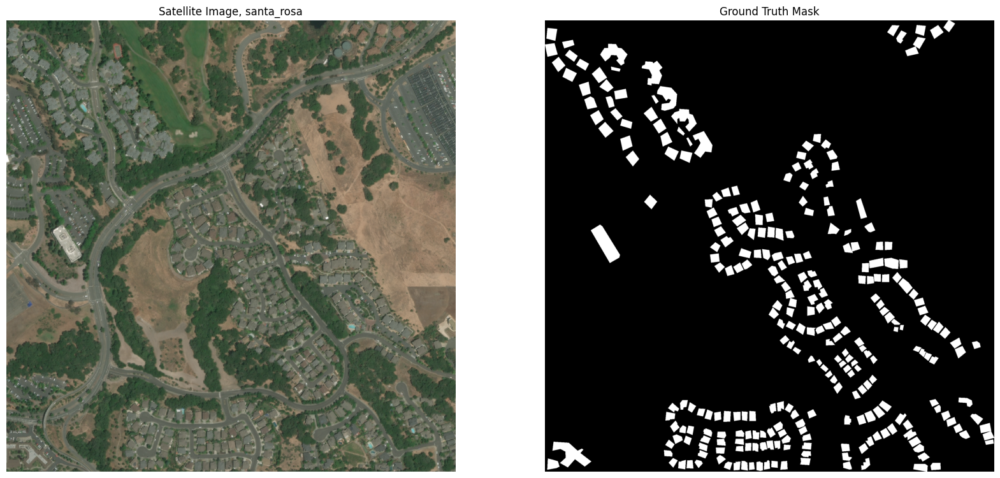

In [7]:
r = rasterio.open("/content/drive/MyDrive/домики_тестовое_задание/домики_тестовое_задание/santa_rosa/RED.tif").read(1)
g = rasterio.open("/content/drive/MyDrive/домики_тестовое_задание/домики_тестовое_задание/santa_rosa/GRN.tif").read(1)
b = rasterio.open("/content/drive/MyDrive/домики_тестовое_задание/домики_тестовое_задание/santa_rosa/BLUE.tif").read(1)

rgb_image_santa_rosa = np.stack([r, g, b], axis=-1)

mask_santa_rosa = rasterio.open("/content/drive/MyDrive/домики_тестовое_задание/домики_тестовое_задание/santa_rosa/all.tif").read(1)  # Assuming binary mask is single-channel

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(rgb_image_santa_rosa)
plt.axis("off")
plt.title("Satellite Image, santa_rosa")
plt.subplot(1, 2, 2)
plt.imshow(mask_santa_rosa, cmap="gray")
plt.axis("off")
plt.title("Ground Truth Mask")
plt.show()

In [8]:
# rgb_image_ventura.shape, rgb_image_santa_rosa.shape

In [9]:
# size = 512
# plt.figure(figsize=(20, 10))
# plt.subplot(1, 2, 1)
# plt.imshow(rgb_image_ventura[-size:, -size:, :])
# plt.axis("off")
# plt.title("Satellite Image, santa_rosa")


In [10]:
# size = 512
# plt.figure(figsize=(20, 10))
# plt.subplot(1, 2, 1)
# plt.imshow(rgb_image_santa_rosa[-size:, -size:, :])
# plt.axis("off")
# plt.title("Satellite Image, santa_rosa")


# Split images on train and test parts

On average there are 0.85 for train and 0.15 for test

In [ ]:
import numpy as np

def split_train_test(image, mask, test_size=512, axis=0):
    """
    Splits a satellite image and its mask into train & test sets with a fixed test size.

    :param image: NumPy array of shape (H, W, C)
    :param mask: NumPy array of shape (H, W)
    :param test_size: Fixed size for the test set (height if axis=0, width if axis=1)
    :param axis: 0 for horizontal (top-bottom) split, 1 for vertical (left-right) split
    :return: train_image, test_image, train_mask, test_mask
    """
    h, w, c = image.shape  


    assert test_size < (h if axis == 0 else w), "Test size exceeds image dimensions!"

    if axis == 0:  
        train_image, test_image = image[test_size: , :, :], image[:test_size, :, :]
        train_mask, test_mask = mask[test_size: , :], mask[:test_size, :]
    else: 
        train_image, test_image = image[:, test_size: , :], image[:, :test_size, :]
        train_mask, test_mask = mask[:, test_size:], mask[:, :test_size]

    return train_image, test_image, train_mask, test_mask




Train Image Shape: (4418, 4061, 3), Test Image Shape: (4418, 512, 3)
Train Mask Shape: (4418, 4061), Test Mask Shape: (4418, 512)


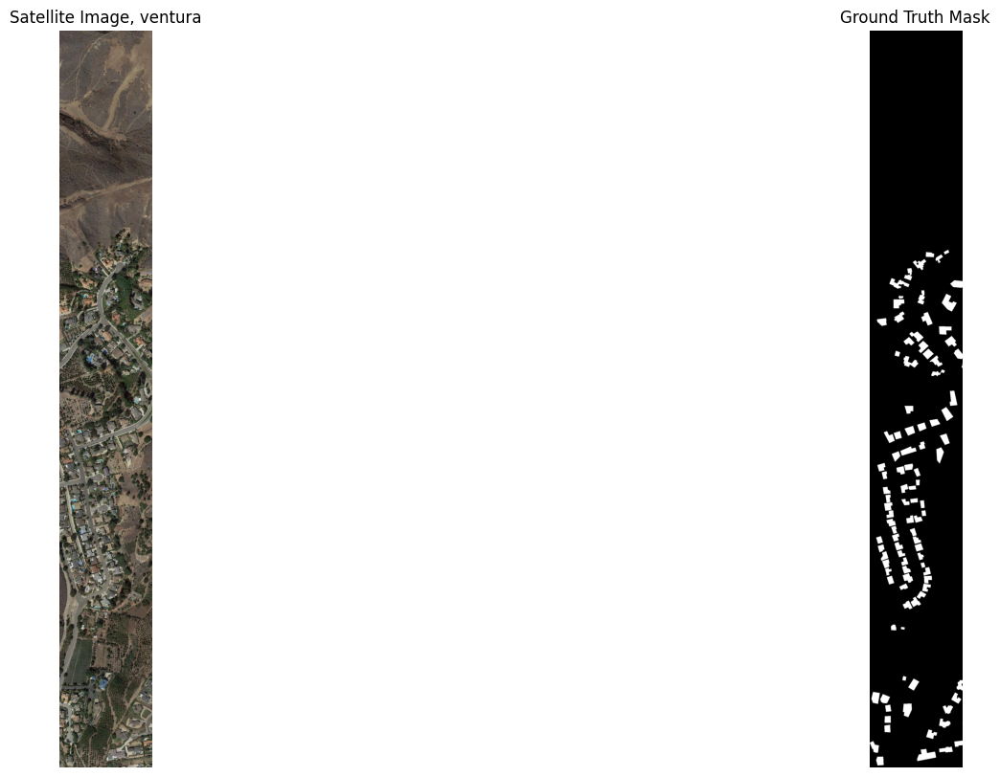

In [ ]:
image = rgb_image_ventura 
mask = mask_ventura

train_image_ventura, test_image_ventura, train_mask_ventura, test_mask_ventura = split_train_test(image, mask, test_size=512, axis = 1)

print(f"Train Image Shape: {train_image_ventura.shape}, Test Image Shape: {test_image_ventura.shape}")
print(f"Train Mask Shape: {train_mask_ventura.shape}, Test Mask Shape: {test_mask_ventura.shape}")

test_image_ventura, test_mask_ventura = test_image_ventura[322 :, :, :], test_mask_ventura[322:, :]

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(test_image_ventura)
plt.axis("off")
plt.title("Satellite Image, ventura")

plt.subplot(1, 2, 2)
plt.imshow(test_mask_ventura, cmap="gray")
plt.axis("off")
plt.title("Ground Truth Mask")
plt.show()


In [13]:

# test_image_ventura.shape

Train Image Shape: (1648, 2148, 3), Test Image Shape: (512, 2148, 3)
Train Mask Shape: (1648, 2148), Test Mask Shape: (512, 2148)


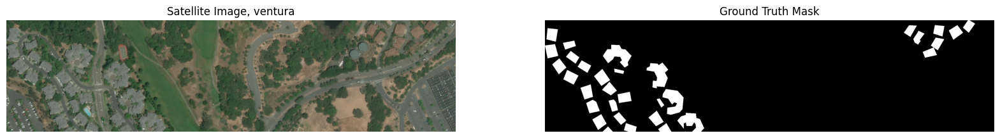

In [ ]:
image = rgb_image_santa_rosa  
mask = mask_santa_rosa

train_image_santa_rosa, test_image_santa_rosa, train_mask_santa_rosa, test_mask_santa_rosa = split_train_test(image, mask, test_size=512, axis = 0)


print(f"Train Image Shape: {train_image_santa_rosa.shape}, Test Image Shape: {test_image_santa_rosa.shape}")
print(f"Train Mask Shape: {train_mask_santa_rosa.shape}, Test Mask Shape: {test_mask_santa_rosa.shape}")

test_image_santa_rosa, test_mask_santa_rosa = test_image_santa_rosa[:, :2048, :], test_mask_santa_rosa[:, :2048]

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(test_image_santa_rosa)
plt.axis("off")
plt.title("Satellite Image, ventura")

plt.subplot(1, 2, 2)
plt.imshow(test_mask_santa_rosa, cmap="gray")
plt.axis("off")
plt.title("Ground Truth Mask")
plt.show()

In [15]:
# test_image_santa_rosa.shape

# Cutting on patches

## Train data

In [16]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

def pad_image_with_content(image, patch_size, stride):
    _, height, width = image.shape

    pad_height = (stride - (height - patch_size) % stride)
    pad_width = (stride - (width - patch_size) % stride)

    padded_image = F.pad(image, (0, pad_width, 0, pad_height), mode='reflect')
    return padded_image


def extract_image_patches_with_overlap(image, patch_size, stride):

    image = pad_image_with_content(image, patch_size, stride)

    unfolded = F.unfold(image.unsqueeze(0), kernel_size=patch_size, stride=stride)

    num_patches = unfolded.shape[-1]
    unfolded = unfolded.view(image.shape[0], patch_size, patch_size, num_patches)
    unfolded = unfolded.permute(0, 3, 1, 2)

    return unfolded




In [17]:
patch_size = 512
stride = 256

In [18]:
image = train_image_ventura
image_tensor = torch.tensor(image, dtype=torch.float32).permute(2, 0, 1)

train_patches_ventura = extract_image_patches_with_overlap(image_tensor, patch_size, stride)


In [19]:
image = train_image_santa_rosa
image_tensor = torch.tensor(image, dtype=torch.float32).permute(2, 0, 1)

train_patches_santa_rosa = extract_image_patches_with_overlap(image_tensor, patch_size, stride)


In [20]:
train_patches_ventura.shape

torch.Size([3, 255, 512, 512])

In [21]:
train_patches_santa_rosa.shape

torch.Size([3, 48, 512, 512])

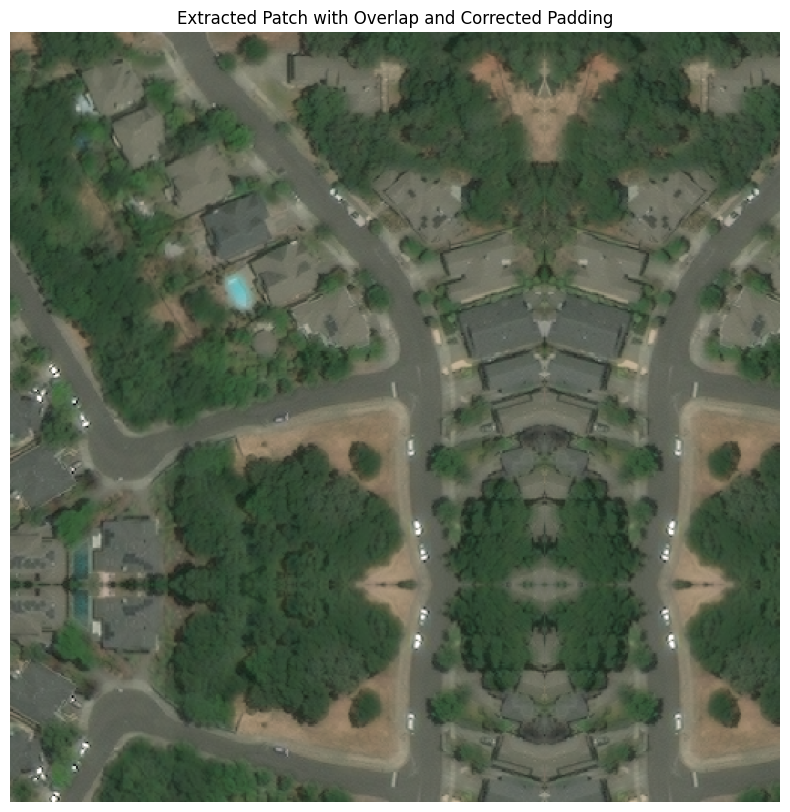

In [22]:
patch_idx = -1
rgb_patch = train_patches_santa_rosa[:, patch_idx, :, :].numpy()
rgb_patch = np.transpose(rgb_patch, (1, 2, 0))
rgb_patch = (rgb_patch - np.min(rgb_patch)) / (np.max(rgb_patch) - np.min(rgb_patch) + 1e-6)

plt.figure(figsize=(10, 10))
plt.title("Extracted Patch with Overlap and Corrected Padding")
plt.imshow(rgb_patch)
plt.axis("off")
plt.show()


In [ ]:
import torch
import torch.nn.functional as F
import numpy as np

def pad_mask_with_content(mask, patch_size, stride):
    if isinstance(mask, np.ndarray):  
        mask = torch.tensor(mask, dtype=torch.float32)

    if mask.dim() == 2:  
        mask = mask.unsqueeze(0)  

    _, height, width = mask.shape  

    pad_height = (stride - (height - patch_size) % stride) 
    pad_width = (stride - (width - patch_size) % stride) 

    padded_mask = F.pad(mask, (0, pad_width, 0, pad_height), mode='reflect')
    return padded_mask

def extract_mask_patches_with_overlap(mask, patch_size, stride):

    if isinstance(mask, np.ndarray):
        mask = torch.tensor(mask, dtype=torch.float32)

    if mask.dim() == 2:
        mask = mask.unsqueeze(0)  

    mask = pad_mask_with_content(mask, patch_size, stride)

    unfolded = F.unfold(mask.unsqueeze(0), kernel_size=patch_size, stride=stride)

    num_patches = unfolded.shape[-1]
    unfolded = unfolded.view(1, patch_size, patch_size, num_patches)
    unfolded = unfolded.permute(0, 3, 1, 2)  

    return unfolded


In [24]:
mask = train_mask_ventura

train_patches_ventura_mask = extract_mask_patches_with_overlap(mask, patch_size, stride)


In [25]:
torch.unique(train_patches_ventura_mask)

tensor([0., 1.])

In [26]:
mask = train_mask_santa_rosa

train_patches_santa_rosa_mask = extract_mask_patches_with_overlap(mask, patch_size, stride)


In [27]:
torch.unique(train_patches_santa_rosa_mask)

tensor([0., 1.])

116
205
127
98
104
34
71
218
12


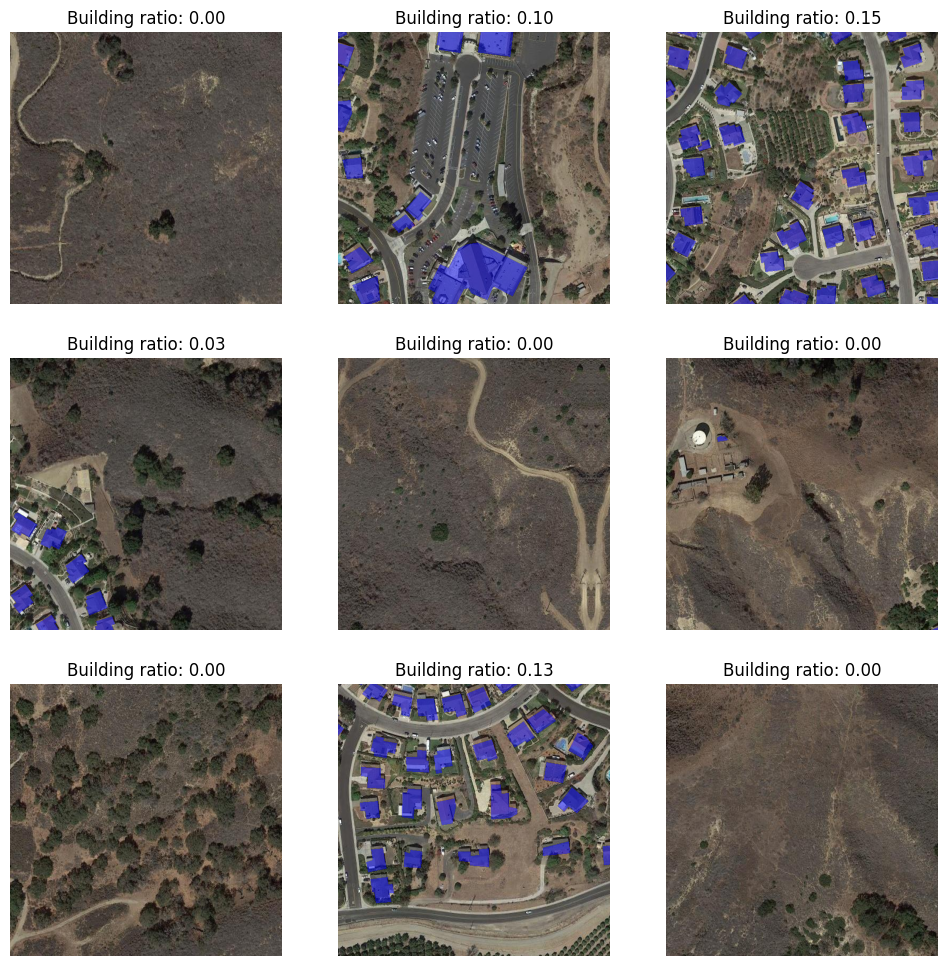

In [28]:
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
cmap = mcolors.ListedColormap(['none', 'blue'])

for i in range(9):

  n = np.random.randint(0, train_patches_ventura_mask.shape[1])
  print(n)
  x = np.transpose(train_patches_ventura[:,n,:,:], (1, 2, 0)) / 255.
  y = np.transpose(train_patches_ventura_mask[:,n,:,:], (1, 2, 0))

  building_ratio = torch.sum(y == 1) / (patch_size**2)

  axes[i//3, i%3].imshow(x)
  axes[i//3, i%3].imshow(y, cmap=cmap, alpha=.5)
  axes[i//3, i%3].axis('off')
  axes[i//3, i%3].set_title("Building ratio: {:.2f}".format(building_ratio))
plt.show()

41
17
8
34
27
43
46
1
19


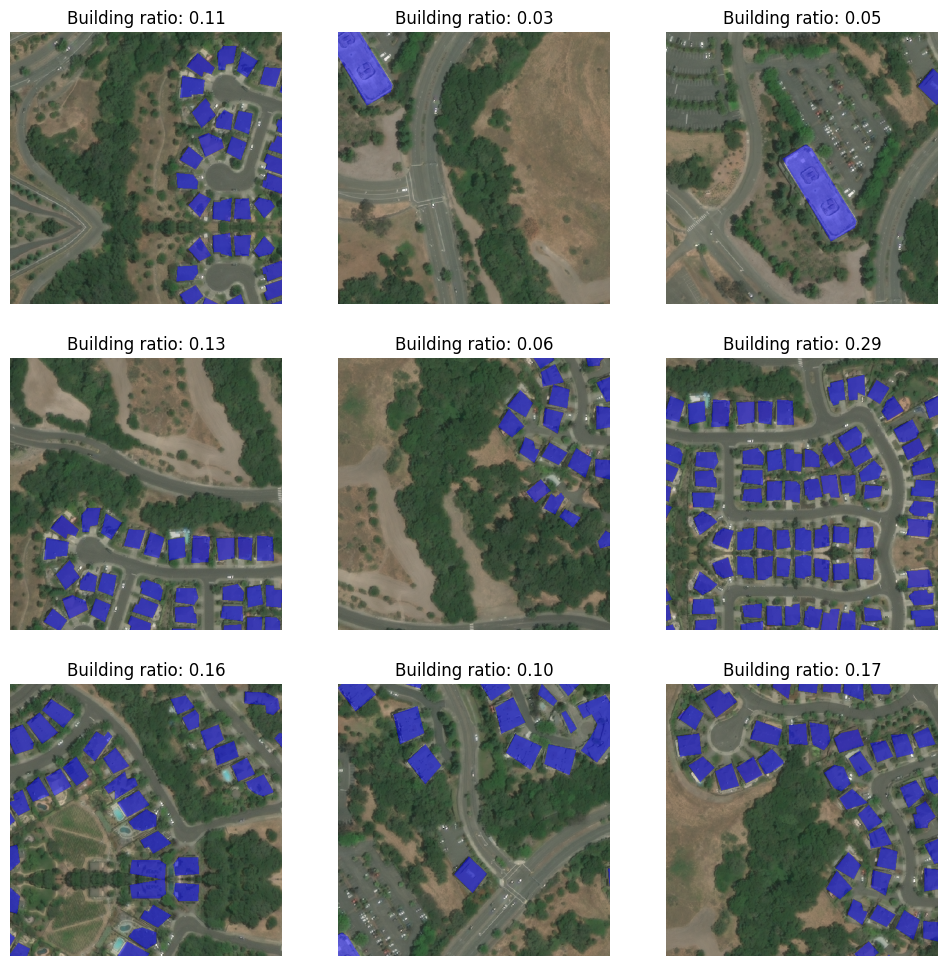

In [29]:
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
cmap = mcolors.ListedColormap(['none', 'blue'])

for i in range(9):

  n = np.random.randint(0, train_patches_santa_rosa_mask.shape[1])
  print(n)
  x = np.transpose(train_patches_santa_rosa[:,n,:,:], (1, 2, 0)) / 255.
  y = np.transpose(train_patches_santa_rosa_mask[:,n,:,:], (1, 2, 0))

  building_ratio = torch.sum(y == 1) / (patch_size**2)

  axes[i//3, i%3].imshow(x)
  axes[i//3, i%3].imshow(y, cmap=cmap, alpha=.5)
  axes[i//3, i%3].axis('off')
  axes[i//3, i%3].set_title("Building ratio: {:.2f}".format(building_ratio))
plt.show()

In [30]:
train_images = np.concatenate((train_patches_ventura.permute(1, 0, 2, 3), train_patches_santa_rosa.permute(1, 0, 2, 3)), axis=0)

train_masks = np.concatenate((train_patches_ventura_mask.permute(1, 0, 2, 3), train_patches_santa_rosa_mask.permute(1, 0, 2, 3)), axis=0)

train_images.shape, train_masks.shape

((303, 3, 512, 512), (303, 1, 512, 512))

## Test data

In [ ]:
import numpy as np
import torch

def cut_patches_no_overlap(data, patch_size):
    """
    Cuts an image or mask into non-overlapping patches of size (patch_size, patch_size).

    Args:
        data (numpy.ndarray or torch.Tensor): Input image or mask.
            - RGB Image shape: (H, W, 3) or (3, H, W)
            - Mask shape: (H, W) or (1, H, W)
        patch_size (int): Size of square patches.

    Returns:
        numpy.ndarray or torch.Tensor: Patches of shape:
            - (N, 3, patch_size, patch_size) for RGB images
            - (N, 1, patch_size, patch_size) for masks
    """

    is_numpy = isinstance(data, np.ndarray)
    if is_numpy:
        data = torch.tensor(data, dtype=torch.float32)

    if data.dim() == 2:  
        data = data.unsqueeze(0)  
    elif data.dim() == 3 and data.shape[-1] == 3: 
        data = data.permute(2, 0, 1)  

    _, height, width = data.shape  

    num_patches_y = height // patch_size
    num_patches_x = width // patch_size

    patches = data.unfold(1, patch_size, patch_size).unfold(2, patch_size, patch_size)
    patches = patches.permute(1, 2, 0, 3, 4).contiguous()  
    patches = patches.view(-1, data.shape[0], patch_size, patch_size)  

    return patches.numpy() if is_numpy else patches 


In [32]:
test_patches_ventura = cut_patches_no_overlap(test_image_ventura, patch_size)
test_patches_ventura_mask = cut_patches_no_overlap(test_mask_ventura, patch_size)

test_patches_santa_rosa = cut_patches_no_overlap(test_image_santa_rosa, patch_size)
test_patches_santa_rosa_mask = cut_patches_no_overlap(test_mask_santa_rosa, patch_size)

In [33]:

test_images = np.concatenate((test_patches_ventura, test_patches_santa_rosa), axis=0)
test_masks = np.concatenate((test_patches_ventura_mask, test_patches_santa_rosa_mask), axis=0)

In [34]:
test_images.shape, test_masks.shape

((12, 3, 512, 512), (12, 1, 512, 512))

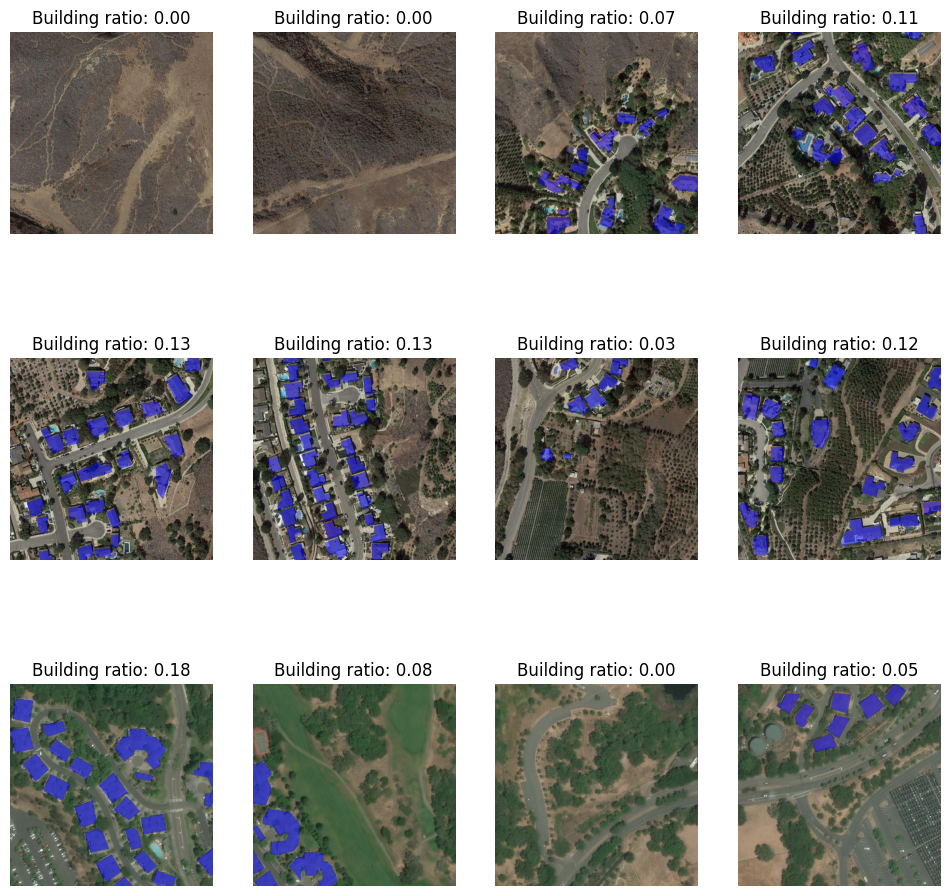

In [35]:
fig, axes = plt.subplots(3, 4, figsize=(12, 12))
cmap = mcolors.ListedColormap(['none', 'blue'])

for i in range(12):

  # n = np.random.randint(0, test_images.shape[0])
  n = i
  x = np.transpose(test_images[n,:,:,:], (1, 2, 0)) / 255.
  y = np.transpose(test_masks[n,:,:,:], (1, 2, 0))

  building_ratio = np.sum(y == 1) / (patch_size**2)

  axes[i//4, i%4].imshow(x)
  axes[i//4, i%4].imshow(y, cmap=cmap, alpha=.5)
  axes[i//4, i%4].axis('off')
  axes[i//4, i%4].set_title("Building ratio: {:.2f}".format(building_ratio))
plt.show()

# Building Dataset

In [36]:
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torchvision.transforms.v2 as transforms
import albumentations as album

import torchmetrics


In [ ]:
class BuildingsDataset(torch.utils.data.Dataset):

    """
    input arrays: (N, C, H, W)
    """

    def __init__(self, images, masks, augmentation=None):
        self.images = images
        self.masks = masks
        self.augmentation = augmentation

    def __getitem__(self, i):
        image = self.images[i]  
        mask = self.masks[i]    

        if self.augmentation:
            image = image.transpose(1, 2, 0) 
            mask = mask.transpose(1, 2, 0)    

            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

            image = image.transpose(2, 0, 1)  
            mask = mask.transpose(2, 0, 1)    

        return image, mask

    def __len__(self):
        return self.images.shape[0]


In [38]:
def get_training_augmentation():
    train_transform = [
        album.OneOf(
            [
                album.HorizontalFlip(p=1),
                album.VerticalFlip(p=1),
                album.RandomRotate90(p=1),
            ],
            p=0.75,
        ),
    ]
    return album.Compose(train_transform)


def visualize(image, mask):

    '''
    input image: (C,H,W)
    '''

    cmap = mcolors.ListedColormap(['none', 'blue'])

    x = image.transpose(1, 2, 0) / 255.
    y = mask.transpose(1, 2, 0)

    building_ratio = np.sum(y == 1) / (patch_size**2)

    plt.imshow(x)
    plt.imshow(y, cmap=cmap, alpha=.5)
    plt.axis('off')
    plt.title("Building ratio: {:.2f}".format(building_ratio))

In [39]:

train_images.shape

(303, 3, 512, 512)

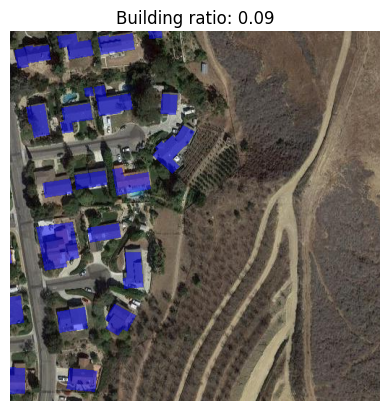

In [40]:
dataset = BuildingsDataset(train_images, train_masks, augmentation=get_training_augmentation())

image, mask = dataset[30]
visualize(image, mask)

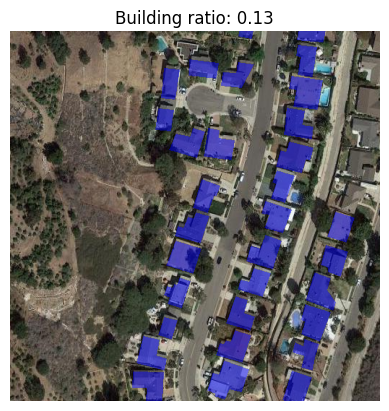

In [41]:
dataset = BuildingsDataset(test_images, test_masks, augmentation=get_training_augmentation())

image, mask = dataset[5]
visualize(image, mask)

In [42]:
image.shape, mask.shape

((3, 512, 512), (1, 512, 512))

# Unet

In [43]:
import copy
import os
import random
import shutil
import zipfile
from math import atan2, cos, sin, sqrt, pi, log

import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from PIL import Image
from numpy import linalg as LA
from torch import optim, nn
from torch.utils.data import DataLoader, random_split
from torch.utils.data.dataset import Dataset
from torchvision import transforms
from tqdm import tqdm

In [ ]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv_op = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv_op(x)


class DownSample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = DoubleConv(in_channels, out_channels)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        down = self.conv(x)
        p = self.pool(down)

        return down, p


class UpSample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_channels, in_channels//2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        x = torch.cat([x1, x2], 1)
        return self.conv(x)


class UNet(nn.Module):
    def __init__(self, in_channels, num_classes):
        super().__init__()
        self.down_convolution_1 = DownSample(in_channels, 64)
        self.down_convolution_2 = DownSample(64, 128)
        self.down_convolution_3 = DownSample(128, 256)
        self.down_convolution_4 = DownSample(256, 512)

        self.bottle_neck = DoubleConv(512, 1024)

        self.up_convolution_1 = UpSample(1024, 512)
        self.up_convolution_2 = UpSample(512, 256)
        self.up_convolution_3 = UpSample(256, 128)
        self.up_convolution_4 = UpSample(128, 64)

        self.out = nn.Conv2d(in_channels=64, out_channels=num_classes, kernel_size=1)

    def forward(self, x):
        down_1, p1 = self.down_convolution_1(x)
        down_2, p2 = self.down_convolution_2(p1)
        down_3, p3 = self.down_convolution_3(p2)
        down_4, p4 = self.down_convolution_4(p3)

        b = self.bottle_neck(p4)

        up_1 = self.up_convolution_1(b, down_4)
        up_2 = self.up_convolution_2(up_1, down_3)
        up_3 = self.up_convolution_3(up_2, down_2)
        up_4 = self.up_convolution_4(up_3, down_1)

        out = self.out(up_4)
        return out


class IoUMetricWithThreshold(torch.nn.Module):
    def __init__(self, threshold=0.5):
        super().__init__()
        self.threshold = threshold
        self.iou_metric = torchmetrics.JaccardIndex(task="binary")  

    def forward(self, preds, targets):
        preds = (preds > self.threshold).float()  
        return self.iou_metric(preds, targets)

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

train_dataset = BuildingsDataset(
    train_images / 255., train_masks,
    augmentation=get_training_augmentation()
)

valid_dataset = BuildingsDataset(
    test_images / 255., test_masks
)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False)




In [46]:
from torchmetrics.classification import BinaryJaccardIndex


In [ ]:
model = UNet(in_channels=3, num_classes=1).to(device)

# loss_fn = smp.losses.DiceLoss(mode="binary").to(device)
loss_fn = nn.BCEWithLogitsLoss().to(device)

# metric = IoUMetricWithThreshold(threshold=0.5).to(device)

metric = BinaryJaccardIndex().to(device)

optimizer = torch.optim.Adam([
    dict(params=model.parameters(), lr=0.00008),
])



In [48]:
torch.cuda.empty_cache()

In [ ]:
EPOCHS = 25

train_losses = []
train_ious = []
val_losses = []
val_ious = []

for epoch in tqdm(range(EPOCHS)):
    model.train()
    train_running_loss = 0
    train_running_iou = 0

    for idx, img_mask in enumerate(tqdm(train_loader, position=0, leave=True)):
        img = img_mask[0].float().to(device)
        mask = img_mask[1].float().to(device)

        y_pred = model(img)

        optimizer.zero_grad()

        iou = metric(y_pred, mask)
        loss = loss_fn(y_pred, mask)

        train_running_loss += loss.item()
        train_running_iou += iou.item()

        loss.backward()
        optimizer.step()

    train_loss = train_running_loss / (idx + 1)
    train_iou = train_running_iou / (idx + 1)

    train_losses.append(train_loss)
    train_ious.append(train_iou)

    model.eval()
    val_running_loss = 0
    val_running_iou = 0

    with torch.no_grad():
        for idx, img_mask in enumerate(tqdm(valid_loader, position=0, leave=True)):
            img = img_mask[0].float().to(device)
            mask = img_mask[1].float().to(device)

            y_pred = model(img)

            loss = loss_fn(y_pred, mask)
            iou = metric(y_pred, mask)

            val_running_loss += loss.item()
            val_running_iou += iou.item()

        val_loss = val_running_loss / (idx + 1)
        val_iou = val_running_iou / (idx + 1)

    val_losses.append(val_loss)
    val_ious.append(val_iou)

    print("-" * 30)
    print(f"Training Loss EPOCH {epoch + 1}: {train_loss:.4f}")
    print(f"Training IOU EPOCH {epoch + 1}: {train_iou:.4f}")
    print("\n")
    print(f"Validation Loss EPOCH {epoch + 1}: {val_loss:.4f}")
    print(f"Validation IOU EPOCH {epoch + 1}: {val_iou:.4f}")
    print("-" * 30)

torch.save(model.state_dict(), '/content/drive/MyDrive/домики_тестовое_задание/my_checkpoint.pth')



  4%|▍         | 1/25 [01:06<26:27, 66.13s/it]

------------------------------
Training Loss EPOCH 1: 0.4745
Training IOU EPOCH 1: 0.0044


Validation Loss EPOCH 1: 0.2897
Validation IOU EPOCH 1: 0.0000
------------------------------


  8%|▊         | 2/25 [02:14<25:44, 67.17s/it]

------------------------------
Training Loss EPOCH 2: 0.3056
Training IOU EPOCH 2: 0.0000


Validation Loss EPOCH 2: 0.2495
Validation IOU EPOCH 2: 0.0000
------------------------------


 12%|█▏        | 3/25 [03:22<24:50, 67.73s/it]

------------------------------
Training Loss EPOCH 3: 0.2651
Training IOU EPOCH 3: 0.0000


Validation Loss EPOCH 3: 0.2285
Validation IOU EPOCH 3: 0.0000
------------------------------


 16%|█▌        | 4/25 [04:30<23:46, 67.93s/it]

------------------------------
Training Loss EPOCH 4: 0.2523
Training IOU EPOCH 4: 0.0000


Validation Loss EPOCH 4: 0.2295
Validation IOU EPOCH 4: 0.0000
------------------------------


 20%|██        | 5/25 [05:38<22:38, 67.93s/it]

------------------------------
Training Loss EPOCH 5: 0.2328
Training IOU EPOCH 5: 0.0000


Validation Loss EPOCH 5: 0.2263
Validation IOU EPOCH 5: 0.0000
------------------------------


 24%|██▍       | 6/25 [06:46<21:32, 68.02s/it]

------------------------------
Training Loss EPOCH 6: 0.2183
Training IOU EPOCH 6: 0.0000


Validation Loss EPOCH 6: 0.2025
Validation IOU EPOCH 6: 0.0000
------------------------------


 28%|██▊       | 7/25 [07:54<20:25, 68.07s/it]

------------------------------
Training Loss EPOCH 7: 0.2261
Training IOU EPOCH 7: 0.0022


Validation Loss EPOCH 7: 0.1980
Validation IOU EPOCH 7: 0.0000
------------------------------


 32%|███▏      | 8/25 [09:02<19:16, 68.01s/it]

------------------------------
Training Loss EPOCH 8: 0.2187
Training IOU EPOCH 8: 0.0000


Validation Loss EPOCH 8: 0.2062
Validation IOU EPOCH 8: 0.0000
------------------------------


 36%|███▌      | 9/25 [10:10<18:07, 68.00s/it]

------------------------------
Training Loss EPOCH 9: 0.2100
Training IOU EPOCH 9: 0.0001


Validation Loss EPOCH 9: 0.1865
Validation IOU EPOCH 9: 0.0000
------------------------------


 40%|████      | 10/25 [11:19<17:01, 68.07s/it]

------------------------------
Training Loss EPOCH 10: 0.1894
Training IOU EPOCH 10: 0.1654


Validation Loss EPOCH 10: 0.1586
Validation IOU EPOCH 10: 0.2290
------------------------------


 44%|████▍     | 11/25 [12:27<15:53, 68.14s/it]

------------------------------
Training Loss EPOCH 11: 0.1657
Training IOU EPOCH 11: 0.3288


Validation Loss EPOCH 11: 0.1381
Validation IOU EPOCH 11: 0.2528
------------------------------


 48%|████▊     | 12/25 [13:35<14:46, 68.18s/it]

------------------------------
Training Loss EPOCH 12: 0.1394
Training IOU EPOCH 12: 0.4195


Validation Loss EPOCH 12: 0.1352
Validation IOU EPOCH 12: 0.2917
------------------------------


 52%|█████▏    | 13/25 [14:43<13:38, 68.24s/it]

------------------------------
Training Loss EPOCH 13: 0.1214
Training IOU EPOCH 13: 0.4870


Validation Loss EPOCH 13: 0.1191
Validation IOU EPOCH 13: 0.3542
------------------------------


 56%|█████▌    | 14/25 [15:52<12:31, 68.29s/it]

------------------------------
Training Loss EPOCH 14: 0.1155
Training IOU EPOCH 14: 0.5178


Validation Loss EPOCH 14: 0.1233
Validation IOU EPOCH 14: 0.3246
------------------------------


 60%|██████    | 15/25 [17:00<11:23, 68.37s/it]

------------------------------
Training Loss EPOCH 15: 0.1082
Training IOU EPOCH 15: 0.5629


Validation Loss EPOCH 15: 0.1152
Validation IOU EPOCH 15: 0.3370
------------------------------


 64%|██████▍   | 16/25 [18:09<10:15, 68.39s/it]

------------------------------
Training Loss EPOCH 16: 0.1028
Training IOU EPOCH 16: 0.5903


Validation Loss EPOCH 16: 0.1149
Validation IOU EPOCH 16: 0.3674
------------------------------


 68%|██████▊   | 17/25 [19:17<09:07, 68.43s/it]

------------------------------
Training Loss EPOCH 17: 0.1012
Training IOU EPOCH 17: 0.5957


Validation Loss EPOCH 17: 0.1133
Validation IOU EPOCH 17: 0.3754
------------------------------


 72%|███████▏  | 18/25 [20:26<07:59, 68.48s/it]

------------------------------
Training Loss EPOCH 18: 0.1021
Training IOU EPOCH 18: 0.5909


Validation Loss EPOCH 18: 0.1275
Validation IOU EPOCH 18: 0.3259
------------------------------


 76%|███████▌  | 19/25 [21:35<06:50, 68.49s/it]

------------------------------
Training Loss EPOCH 19: 0.0952
Training IOU EPOCH 19: 0.6062


Validation Loss EPOCH 19: 0.1121
Validation IOU EPOCH 19: 0.3450
------------------------------


 80%|████████  | 20/25 [22:43<05:42, 68.43s/it]

------------------------------
Training Loss EPOCH 20: 0.0986
Training IOU EPOCH 20: 0.5882


Validation Loss EPOCH 20: 0.1121
Validation IOU EPOCH 20: 0.3811
------------------------------


 84%|████████▍ | 21/25 [23:51<04:33, 68.41s/it]

------------------------------
Training Loss EPOCH 21: 0.0903
Training IOU EPOCH 21: 0.6395


Validation Loss EPOCH 21: 0.1136
Validation IOU EPOCH 21: 0.3836
------------------------------


 88%|████████▊ | 22/25 [24:59<03:25, 68.37s/it]

------------------------------
Training Loss EPOCH 22: 0.0925
Training IOU EPOCH 22: 0.6133


Validation Loss EPOCH 22: 0.1141
Validation IOU EPOCH 22: 0.3695
------------------------------


 92%|█████████▏| 23/25 [26:08<02:16, 68.35s/it]

------------------------------
Training Loss EPOCH 23: 0.0859
Training IOU EPOCH 23: 0.6361


Validation Loss EPOCH 23: 0.1094
Validation IOU EPOCH 23: 0.3683
------------------------------


 96%|█████████▌| 24/25 [27:16<01:08, 68.36s/it]

------------------------------
Training Loss EPOCH 24: 0.0840
Training IOU EPOCH 24: 0.6564


Validation Loss EPOCH 24: 0.1113
Validation IOU EPOCH 24: 0.3725
------------------------------


100%|██████████| 25/25 [28:24<00:00, 68.20s/it]


------------------------------
Training Loss EPOCH 25: 0.0820
Training IOU EPOCH 25: 0.6543


Validation Loss EPOCH 25: 0.1079
Validation IOU EPOCH 25: 0.3946
------------------------------


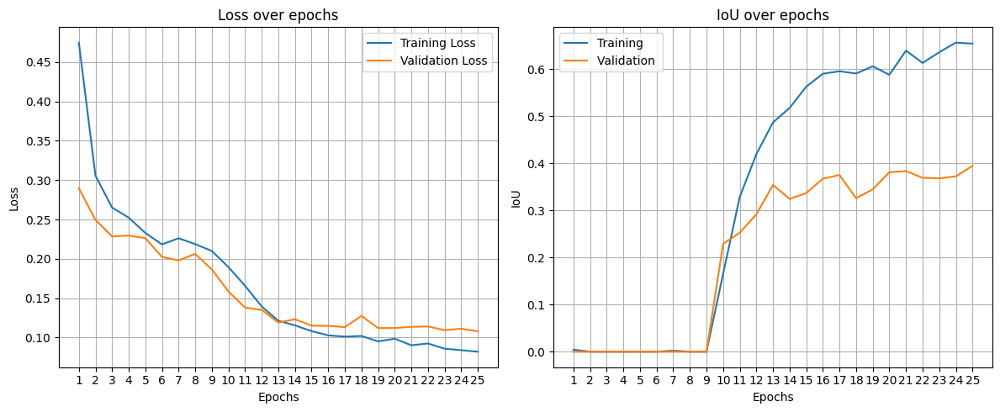

In [50]:
epochs_list = list(range(1, EPOCHS + 1))

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_list, train_losses, label='Training Loss')
plt.plot(epochs_list, val_losses, label='Validation Loss')
plt.xticks(ticks=list(range(1, EPOCHS + 1, 1)))
plt.title('Loss over epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.tight_layout()

plt.legend()


plt.subplot(1, 2, 2)
plt.plot(epochs_list, train_ious, label='Training ')
plt.plot(epochs_list, val_ious, label='Validation ')
plt.xticks(ticks=list(range(1, EPOCHS + 1, 1)))
plt.title('IoU over epochs')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.grid()
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
def images_inference(image_tensors, mask_tensors, model_pth, device):

    cmap = mcolors.ListedColormap(['none', 'blue'])

    model = UNet(in_channels=3, num_classes=1).to(device)
    model.load_state_dict(torch.load(model_pth, map_location=torch.device(device)))

    metric = IoUMetricWithThreshold(threshold=0.5).to(device)

    for image, mask in zip(image_tensors, mask_tensors):

        image = torch.from_numpy(image)
        mask = torch.from_numpy(mask)

        pred_mask = model(image.unsqueeze(0))
        pred_mask = pred_mask.squeeze(0).permute(1,2,0)
        mask = mask.permute(1, 2, 0).to(device)


        print(f"IoU: {round(float(metric(pred_mask, mask)),5)}")

        image = image.cpu().detach().permute(1, 2, 0)
        pred_mask = pred_mask.cpu().detach()
        pred_mask[pred_mask < 0] = 0
        pred_mask[pred_mask > 0] = 1

        plt.figure(figsize=(15, 16))
        plt.subplot(131), plt.imshow(image), plt.title("original")
        plt.subplot(132), plt.imshow(image), plt.imshow(pred_mask, cmap=cmap, alpha=.5), plt.title("predicted")
        plt.subplot(133), plt.imshow(image), plt.imshow(mask, cmap=cmap, alpha=.5), plt.title("mask")
        plt.show()

In [59]:
n = 12

images = []
masks = []

for i in range(n):

    sample = valid_loader.dataset[i]
    images.append(sample[0])
    masks.append(sample[1])


IoU: 0.0


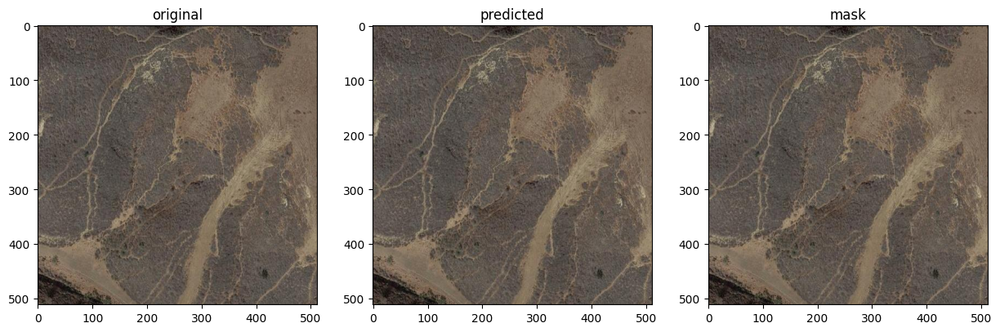

IoU: 0.0


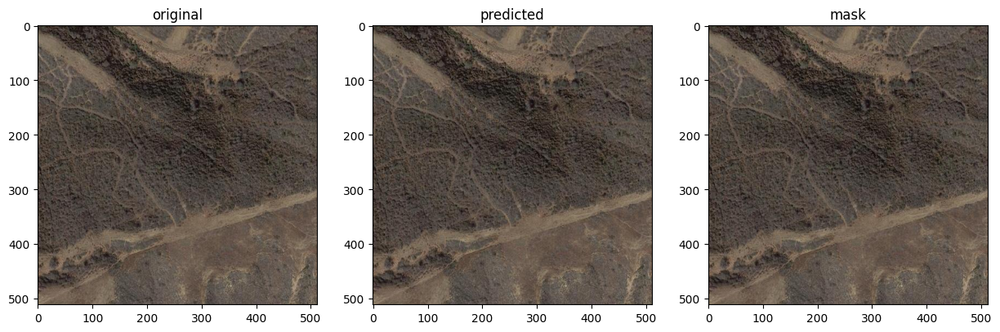

IoU: 0.49221


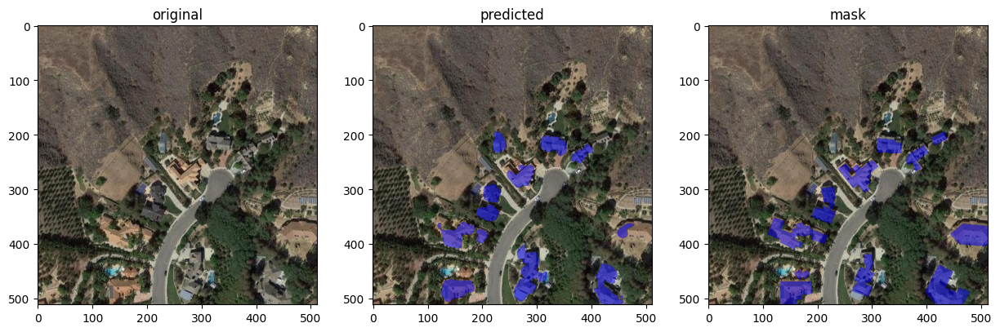

IoU: 0.54061


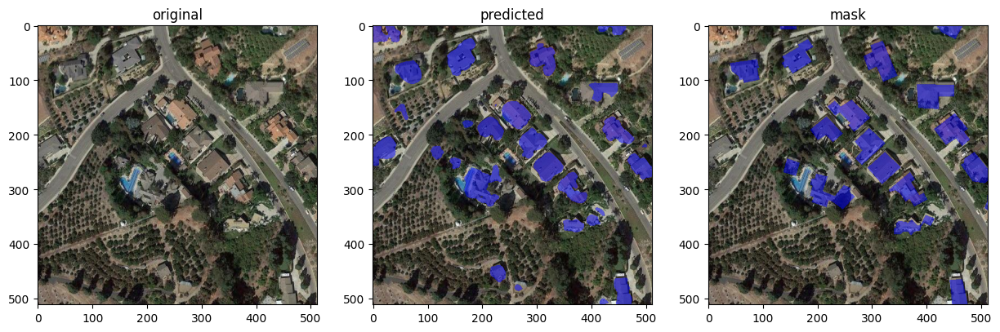

IoU: 0.58483


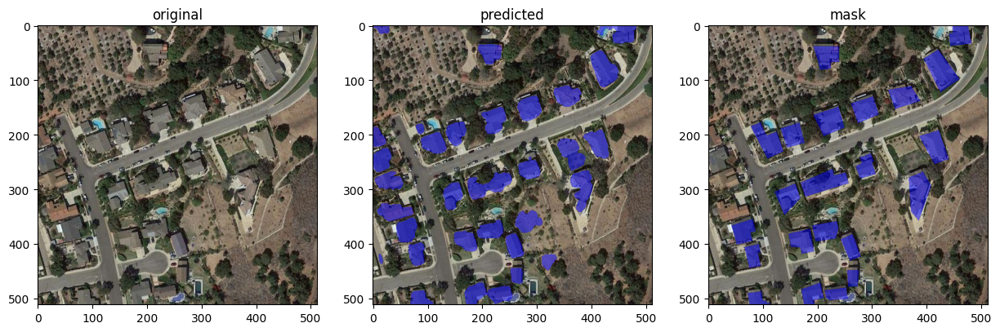

IoU: 0.61795


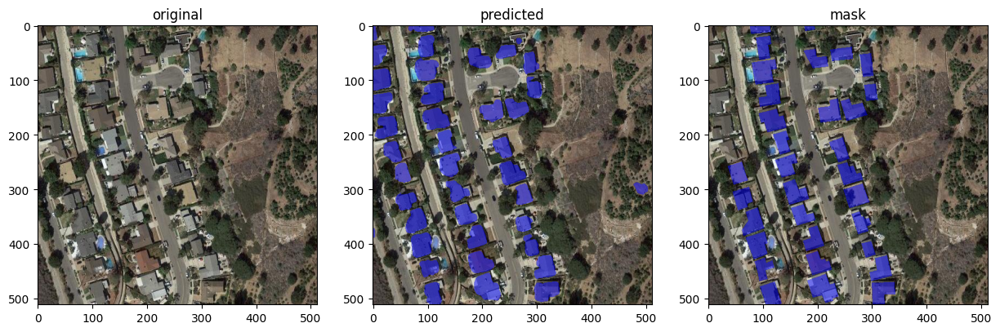

IoU: 0.44934


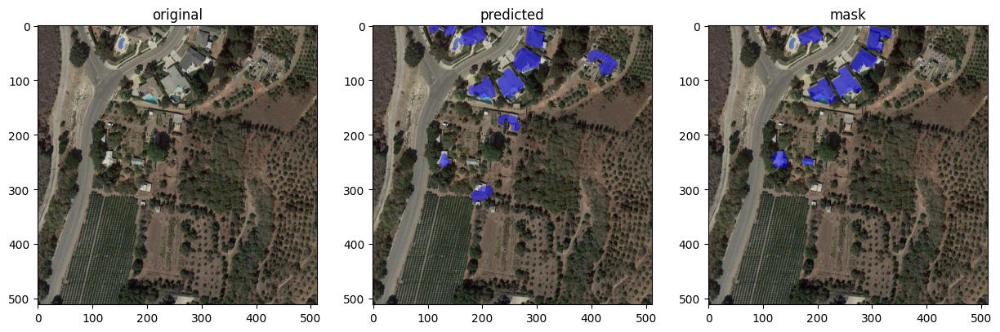

IoU: 0.61291


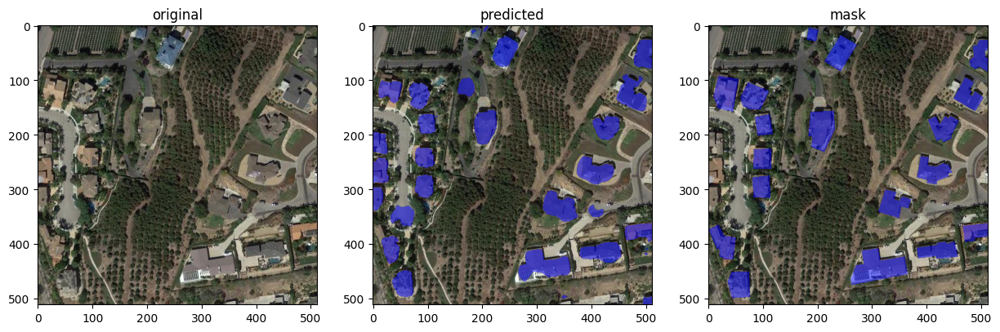

IoU: 0.59447


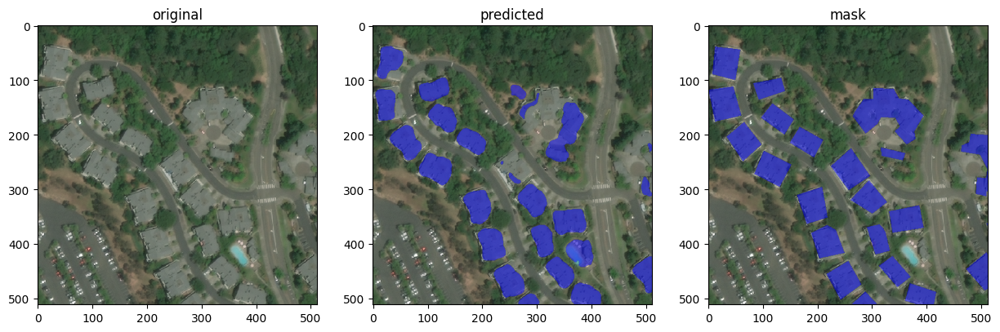

IoU: 0.24112


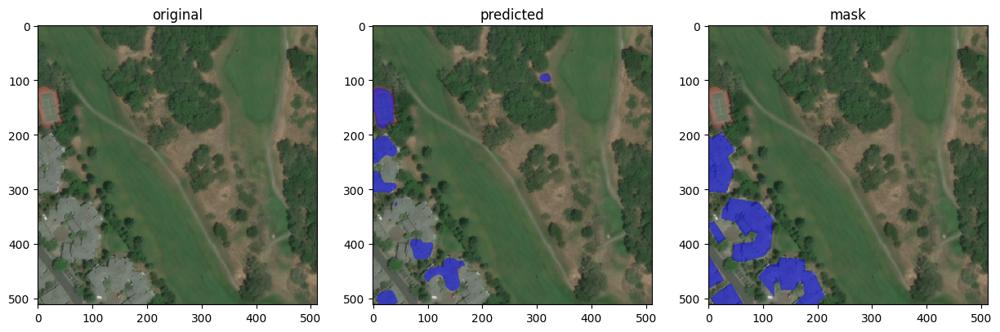

IoU: 0.0


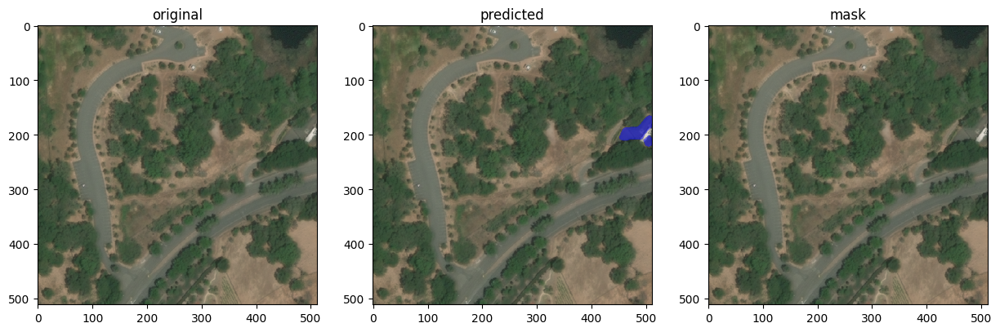

IoU: 0.47365


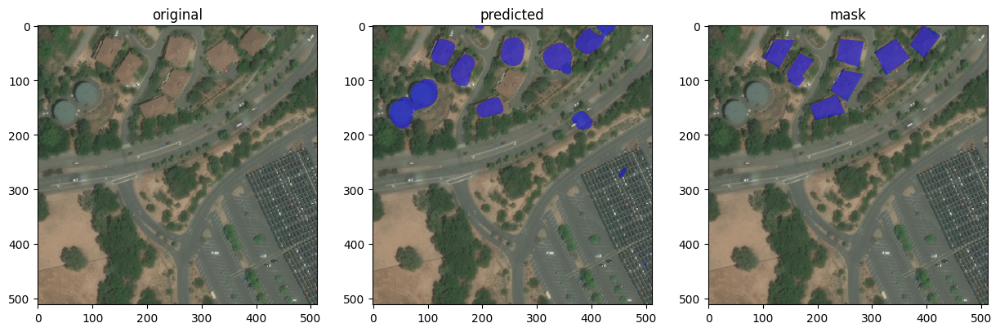

In [60]:
model_pth='/content/drive/MyDrive/домики_тестовое_задание/my_checkpoint.pth'
images_inference(images, masks, model_pth, device="cpu")
